In [2]:
import pandas as pd
from pathlib import Path
import os

parent_directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline"

dataframes = []

for folder_name in os.listdir(parent_directory):
    folder_path = os.path.join(parent_directory, folder_name)
    
    if os.path.isdir(folder_path):
        if "max_freqs_log_likelyhood_esm2_" in folder_name: 
            for filename in os.listdir(folder_path):
                if filename.endswith(".csv"):
                    file_path = os.path.join(folder_path, filename)
                    
                    Segment = filename.rsplit('_', 1)[-1].replace('.csv', '')
                    Model = filename.rsplit('_', 4)[-3].replace('.csv', '')

                    df_merge = pd.read_csv(file_path)
                    df_merge['Segment'] = Segment.upper()
                    df_merge['Model'] = Model
                    dataframes.append(df_merge)

                df_all_segements_all_models = pd.concat(dataframes)

In [2]:
df_all_segements_all_models

,node,max_frequency,sequence,log_likelyhood,runtime,Segment,Model
0,NODE_0000001,1.000006,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
1,A/Aichi/2/1968-egg,0.071429,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.689514,185.333,NS,15B
2,NODE_0000002,1.000006,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
3,NODE_0000007,0.800000,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
4,A/Albany/4/1969-egg,0.142857,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
...,...,...,...,...,...,...,...
1422,A/Michigan/UOM10049574069/2023,0.062299,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-345.390991,327.000,PA,3B
1423,A/SouthAfrica/PET28958/2023,0.148849,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-345.390991,327.000,PA,3B
1424,NODE_0001008,0.533565,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-346.293213,327.000,PA,3B
1425,A/Singapore/NTF0007/2022,0.533565,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-346.293213,327.000,PA,3B


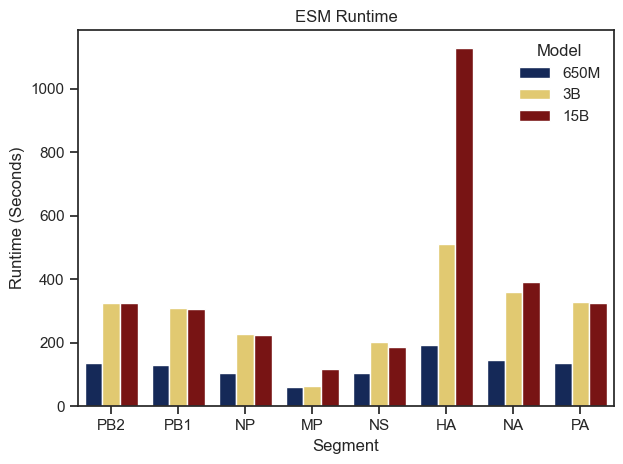

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

model_order = ['650M', '3B', '15B']

palette = {
    '650M': '#0a2463',
    '3B': '#f4d35e',
    '15B': '#890304'
}

df_all_segements_all_models['Model'] = pd.Categorical(
    df_all_segements_all_models['Model'], 
    categories=model_order, 
    ordered=True
)

df_all_segements_all_models = df_all_segements_all_models.sort_values('Model')

#sns.color_palette("pastel")

sns.barplot(
    data=df_all_segements_all_models, 
    x='Segment', 
    y='runtime', 
    hue='Model', 
    hue_order=model_order,  
    errorbar=None,
    palette=palette
)

plt.title("ESM Runtime")
plt.xlabel("Segment")
plt.ylabel("Runtime (Seconds)")
plt.legend(title="Model",frameon=False, loc='upper right')
plt.tight_layout()

plt.show()

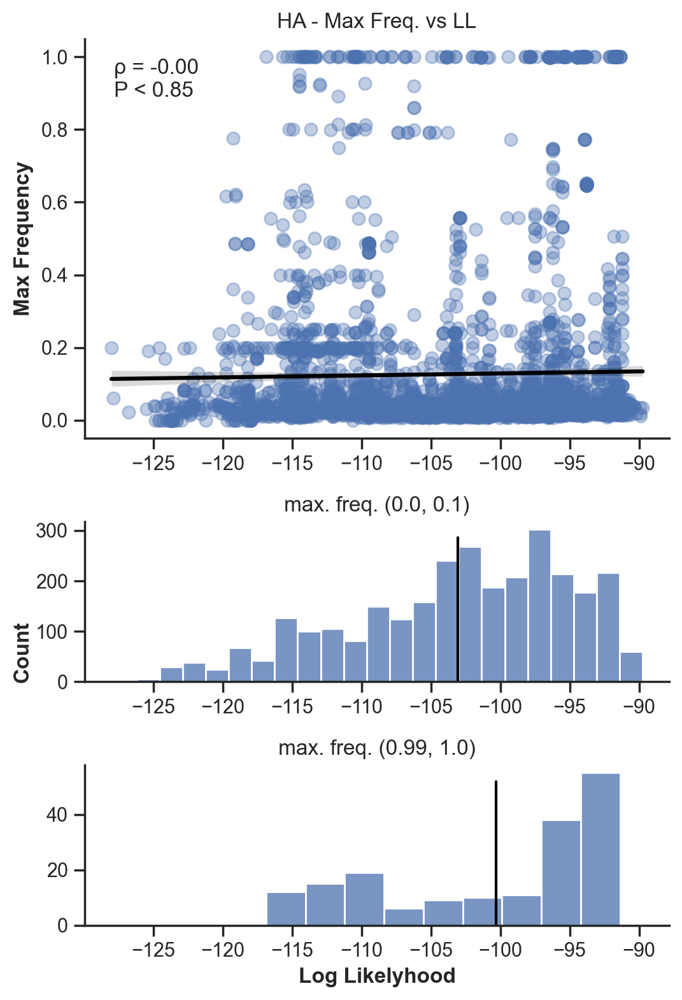

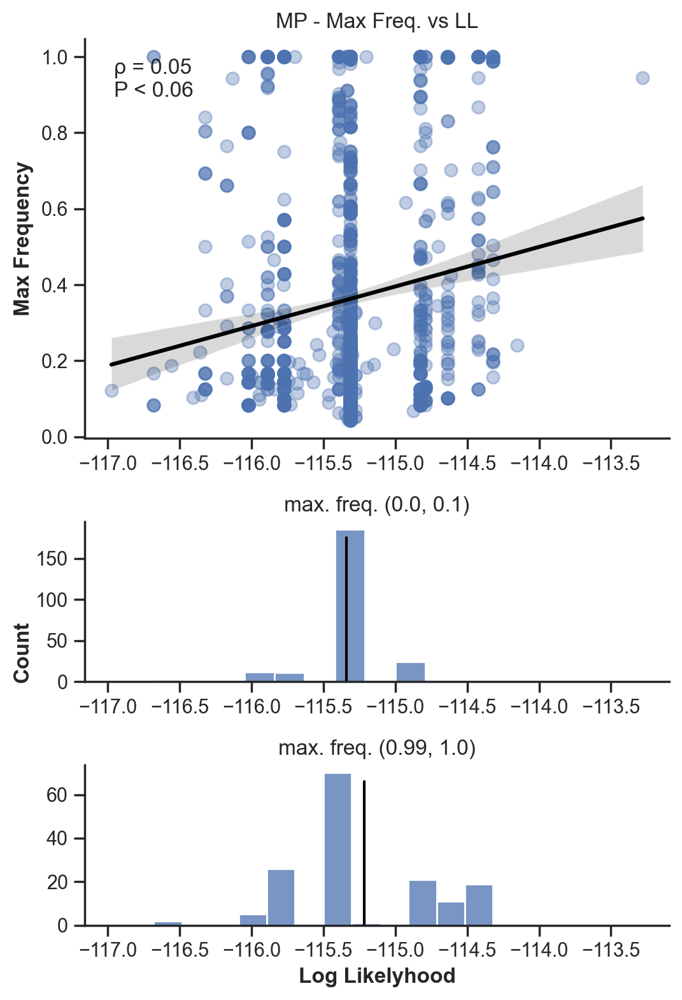

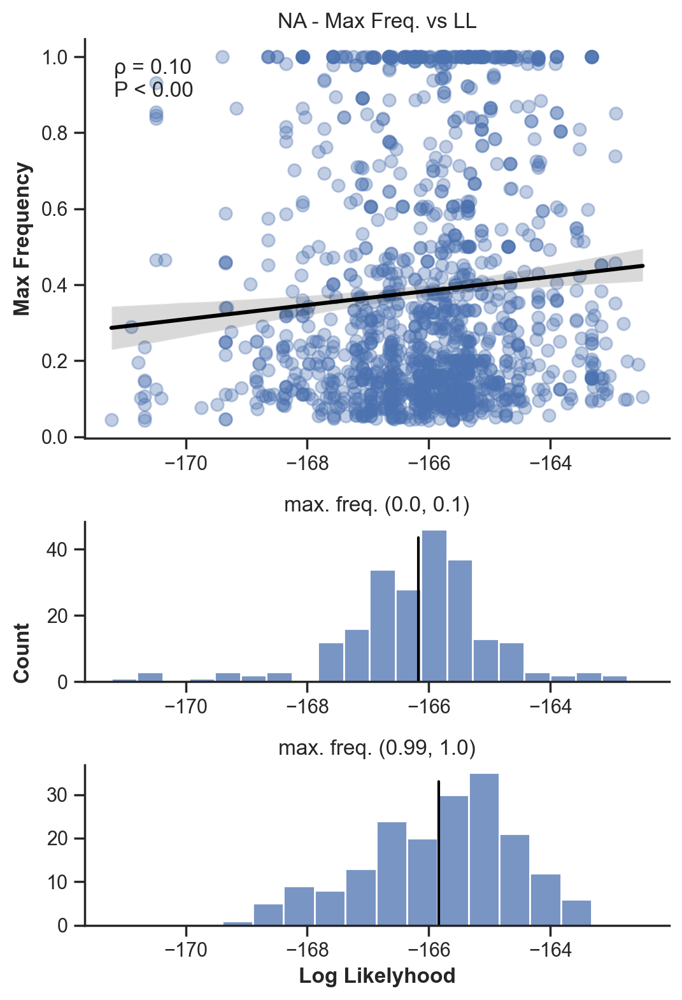

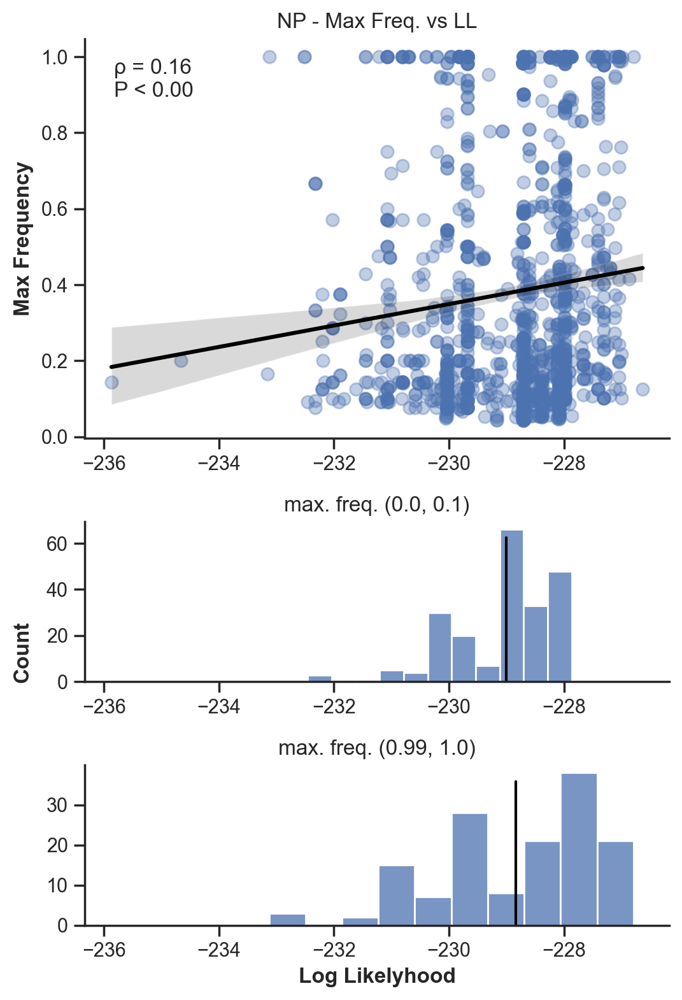

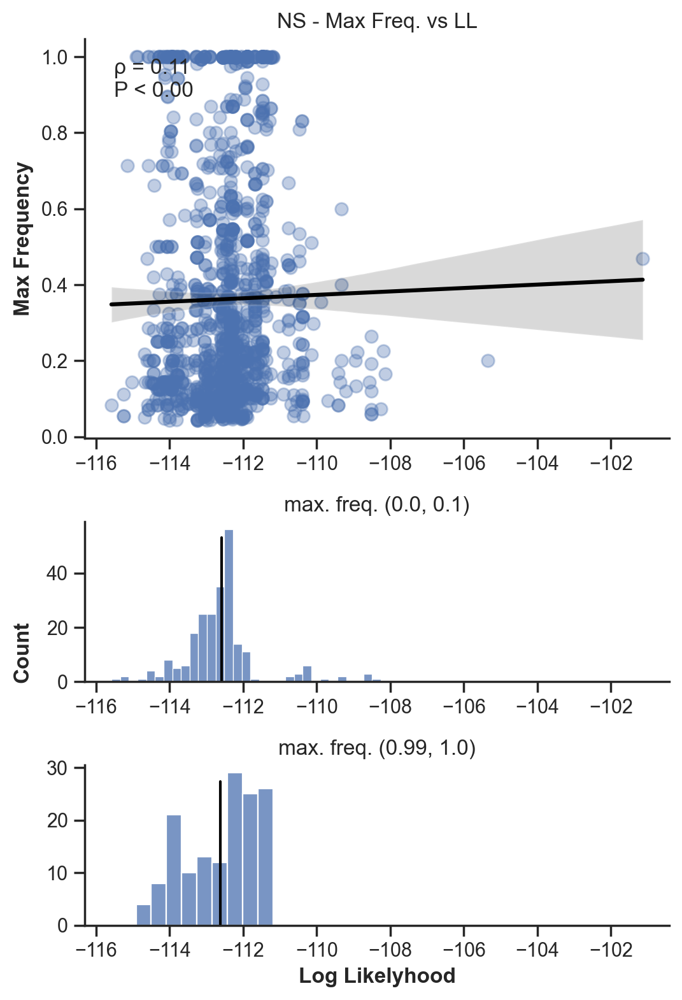

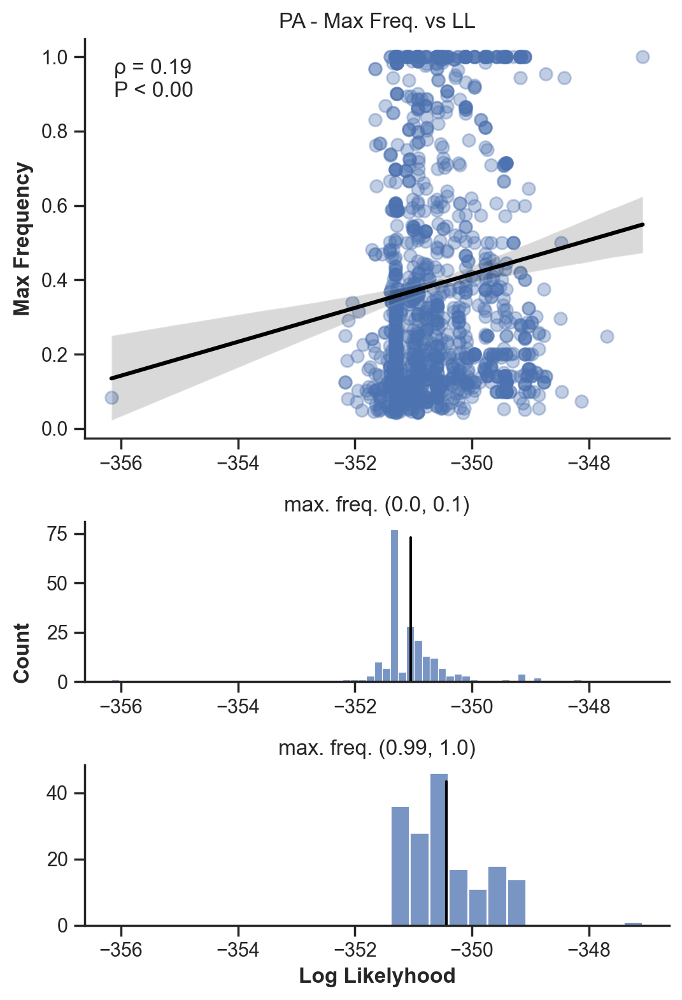

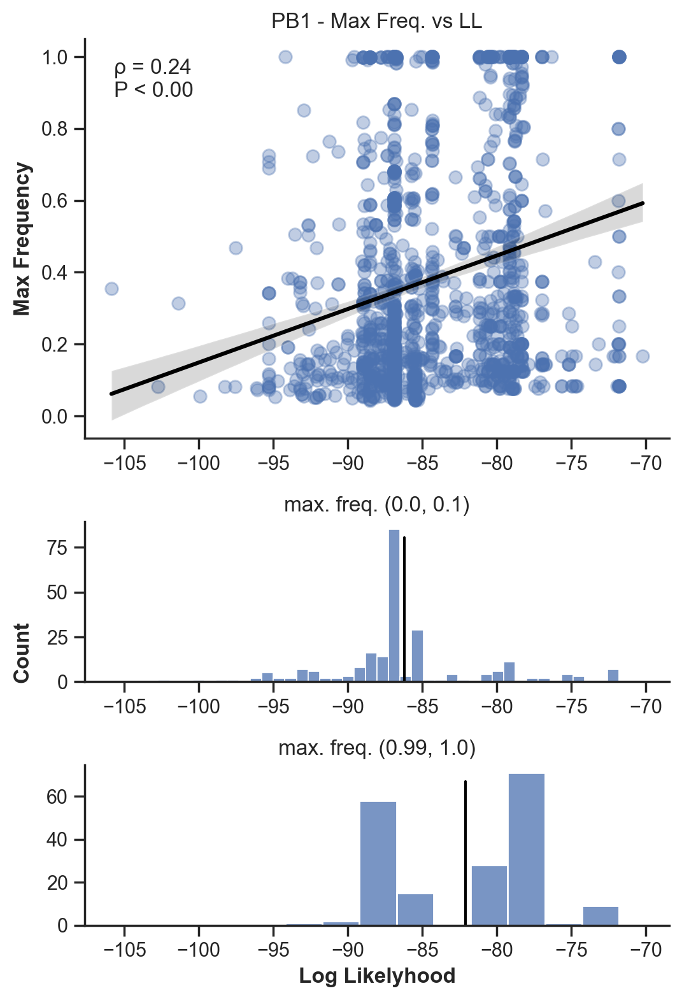

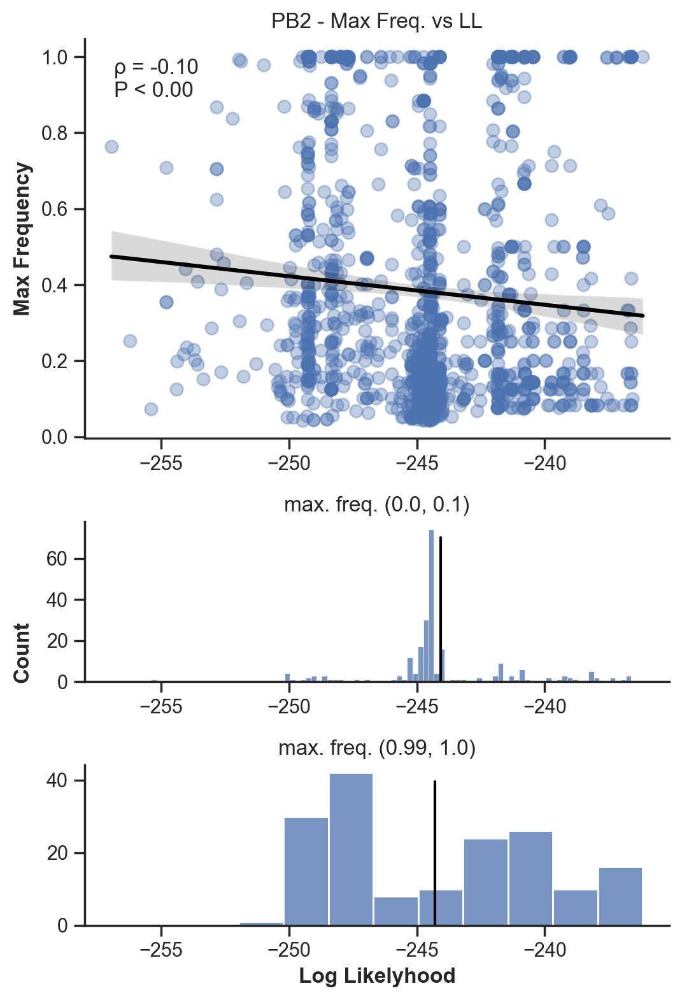

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import gridspec
from scipy.stats import spearmanr

# Look nicer in Jupyter on Mac
#%config InlineBackend.figure_format = 'retina'

directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"
output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots")


os.makedirs(output_dir, exist_ok=True)

sns.set_theme(style="whitegrid")
sns.set_style("ticks")

df_all_segements_all_model_filtered = df_all_segements_all_models[df_all_segements_all_models['Model'] == '650M']

for segment, group in df_all_segements_all_model_filtered.groupby('Segment'):
        
        df = df_all_segements_all_model_filtered[df_all_segements_all_model_filtered['Segment'] == segment]


        if segment == "PA":
          df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

        df_below_01 = df[df['max_frequency'] < 0.1]
        df_above_1 = df[df['max_frequency'] >= 0.99]

        fig = plt.figure(figsize=(5.5, 8))
        gs = gridspec.GridSpec(3, 1, height_ratios=[1, 0.4, 0.4]) 

        ax = fig.add_subplot(gs[0])
        ax1 = fig.add_subplot(gs[1], sharex=ax)
        ax2 = fig.add_subplot(gs[2], sharex=ax)

        sns.set_theme(style="whitegrid")
        sns.set_style("ticks")
        sns.regplot(data=df, y="max_frequency", x="log_likelyhood", ax=ax, scatter_kws={'s': 50, 'alpha': 0.35}, line_kws={'color': 'black'})
        
        ax.set_title(f"{segment.upper()} - Max Freq. vs LL")
        ax.set_xlabel("")

        spearman_corr, p_value = spearmanr(df['max_frequency'], df['log_likelyhood'])

        textstr = (
            f'ρ = {spearman_corr:.2f}\n'
            f'P < {p_value:.2f}\n'
        )

        ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.0))

        ax.set_ylabel("Max Frequency", weight='bold')

        mean_below_01 = df_below_01['log_likelyhood'].mean()

        sns.histplot(data=df_below_01, x="log_likelyhood", ax=ax1)
        ax1.set_title("max. freq. (0.0, 0.1)")
        ax1.axvline(mean_below_01, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
        ax1.set_ylabel("")
        ax1.set_xlabel("")

        mean_above_1 = df_above_1['log_likelyhood'].mean()

        sns.histplot(data=df_above_1, x="log_likelyhood", ax=ax2)
        ax2.set_title("max. freq. (0.99, 1.0)")
        ax2.axvline(mean_above_1, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
        ax2.set_ylabel("")
        ax2.set_xlabel("Log Likelyhood", weight='bold')

        fig.text(0.03, 0.35, 'Count', va='center', rotation='vertical', fontsize=12, weight='bold')

        ax.spines[['right', 'top']].set_visible(False)
        ax1.spines[['right', 'top']].set_visible(False)
        ax2.spines[['right', 'top']].set_visible(False)


        plt.tight_layout()

        #plt.show()

        #output_path = os.path.join("/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots/", f"LL_vs_Max_Frequency_{segment}.png")
        #plt.savefig(output_path, dpi=300)
        #plt.close()

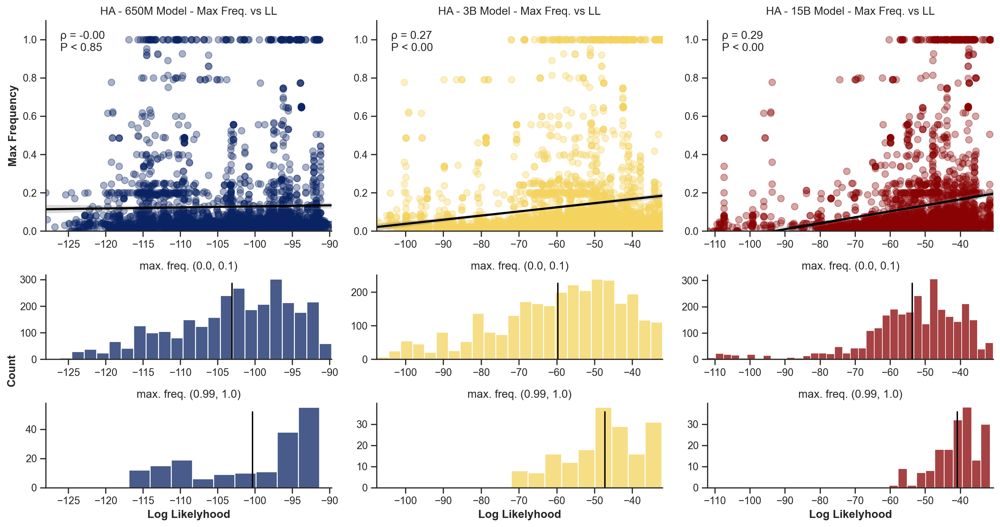

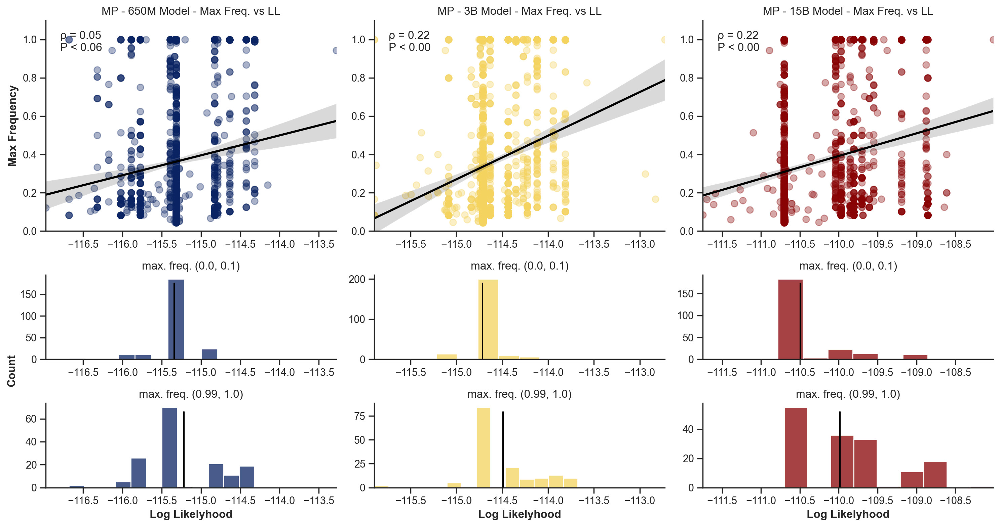

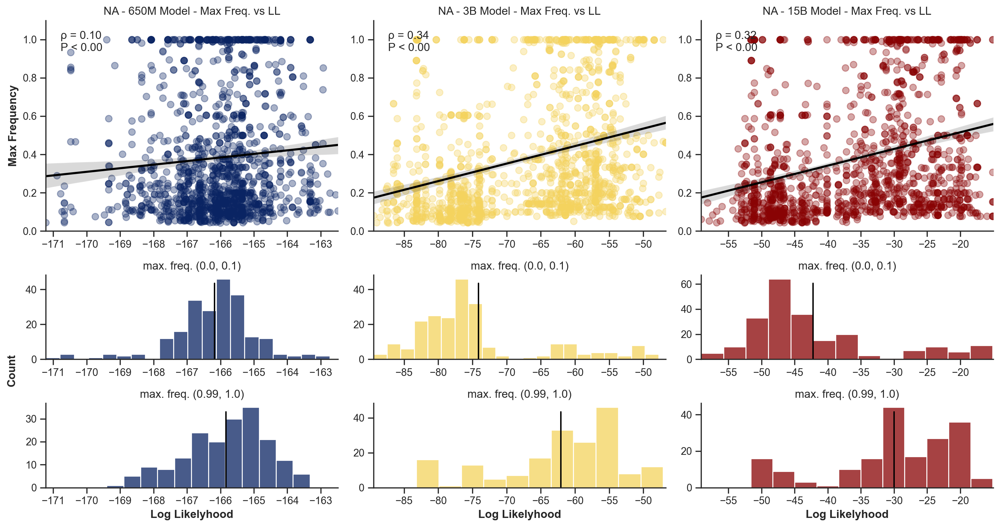

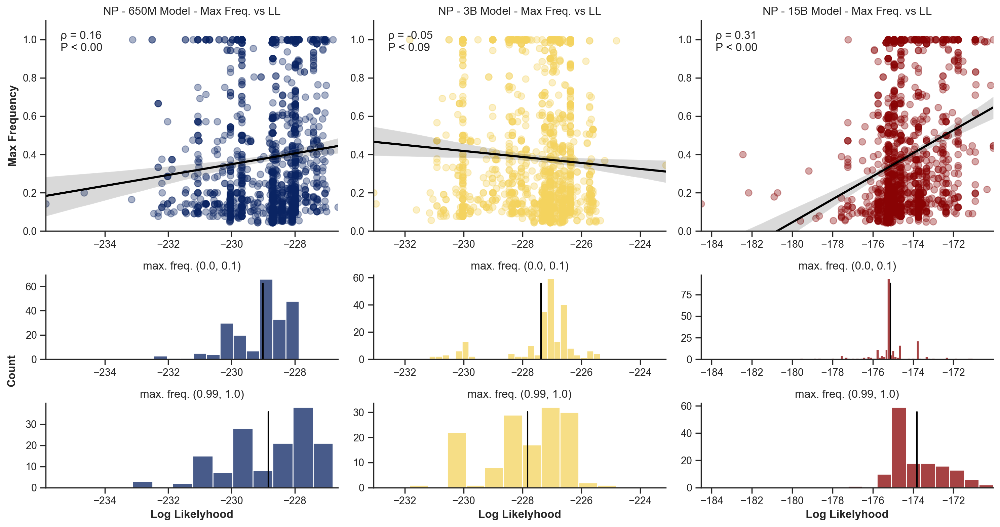

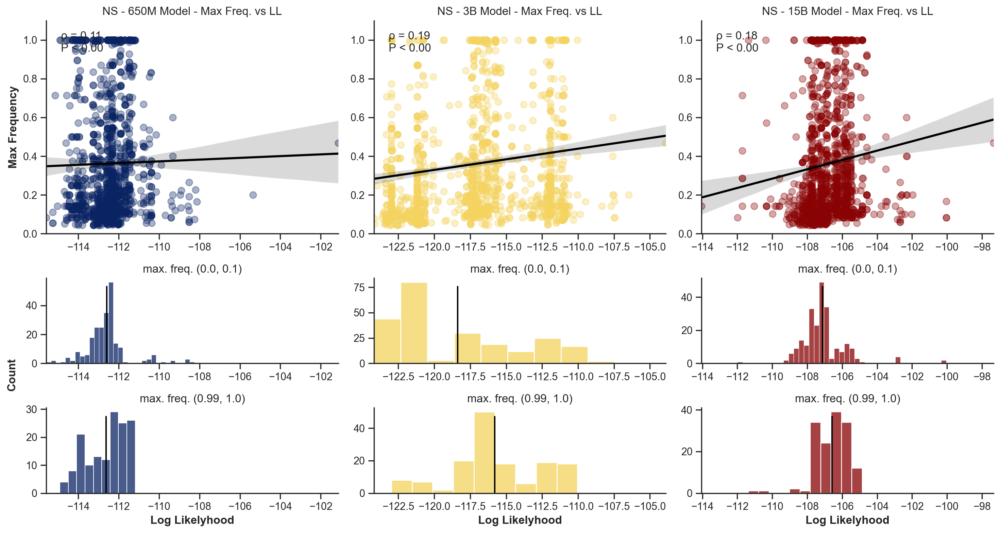

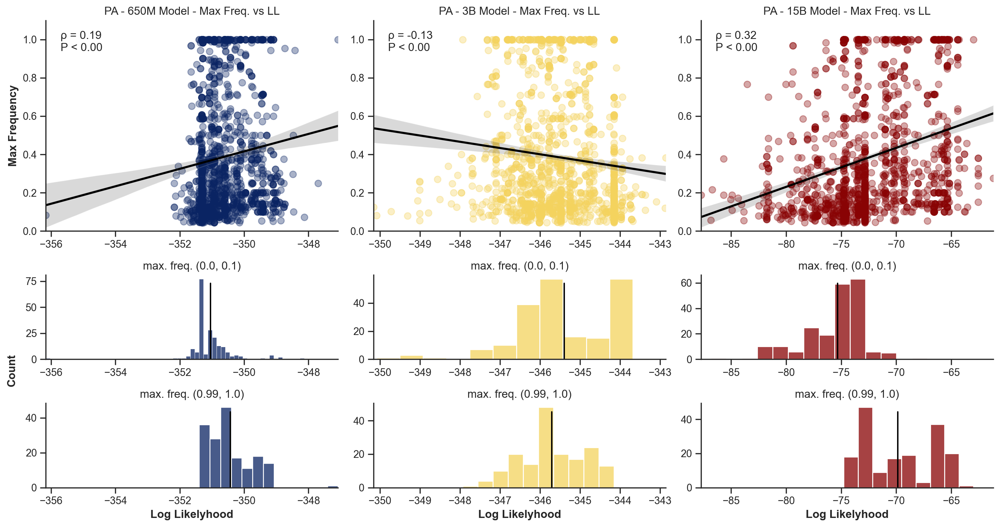

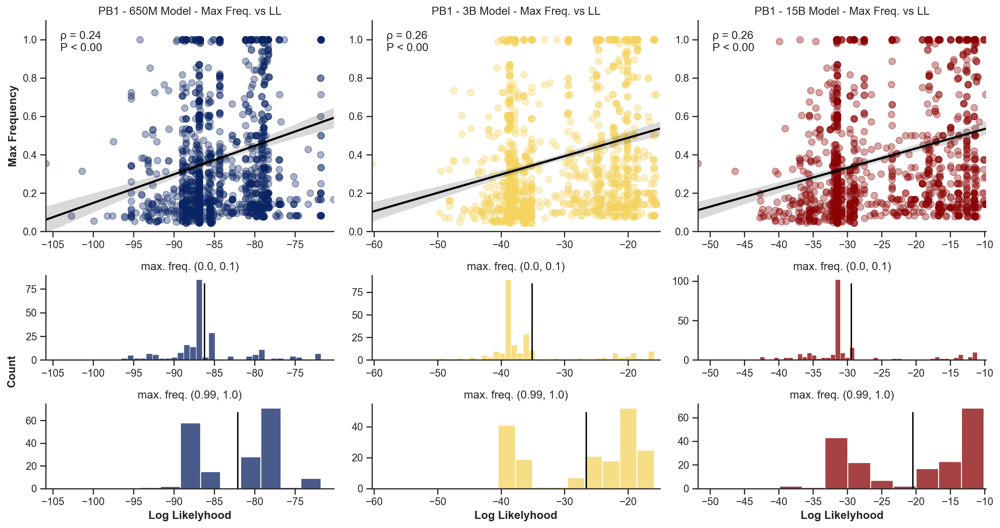

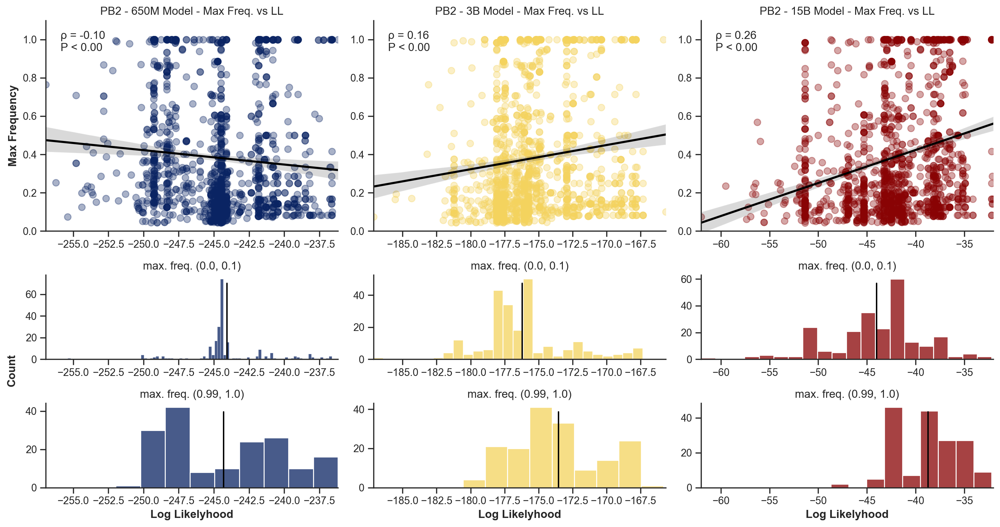

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import gridspec
from scipy.stats import spearmanr

# Look nicer in Jupyter on Mac
#%config InlineBackend.figure_format = 'retina'

#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"
output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots")

os.makedirs(output_dir, exist_ok=True)

sns.set_theme(style="whitegrid")
sns.set_style("ticks")

def plot_regression(ax, data, x_col, y_col, title, ylabel="", color="#0a2463"):
    sns.regplot(data=data, y=y_col, x=x_col, ax=ax, scatter_kws={'s': 50, 'alpha': 0.35, 'color': color}, line_kws={'color': 'black'})
    ax.set_title(title)
    ax.set_xlabel("")
    spearman_corr, p_value = spearmanr(data[y_col], data[x_col])
    textstr = (
        f'ρ = {spearman_corr:.2f}\n'
        f'P < {p_value:.2f}\n'
    )
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.0))
    ax.set_ylabel(ylabel, weight='bold')
    ax.set_xlim(data[x_col].min(), data[x_col].max())
    ax.set_ylim(0, 1.1)

def plot_histogram(ax, data, mean_value, title, xlabel="", color="#0a2463"):
    sns.histplot(data=data, x="log_likelyhood", ax=ax, color= color)
    ax.set_title(title)
    ax.axvline(mean_value, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
    ax.set_ylabel("")
    ax.set_xlabel(xlabel, weight='bold' if xlabel else 'normal')

segment = "MP"

for segment, group in df_all_segements_all_models.groupby('Segment'):

    fig = plt.figure(figsize=(5 * 3, 8))
    gs_main = gridspec.GridSpec(3, 3, height_ratios=[1, 0.4, 0.4])

    df = df_all_segements_all_models[df_all_segements_all_models['Segment'] == segment]

    if segment == "PA":
        df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

    df_650 = df[df['Model'] == "650M"]
    df_3B = df[df['Model'] == "3B"]
    df_15B = df[df['Model'] == "15B"]

    df_below_1_650 = df_650[df_650['max_frequency'] < 0.1]
    df_above_1_650 = df_650[df_650['max_frequency'] >= 0.99]
    df_below_1_3B = df_3B[df_3B['max_frequency'] < 0.1]
    df_above_1_3B = df_3B[df_3B['max_frequency'] >= 0.99]
    df_below_1_15B = df_15B[df_15B['max_frequency'] < 0.1]
    df_above_1_15B = df_15B[df_15B['max_frequency'] >= 0.99]

    ax = fig.add_subplot(gs_main[0, 0])
    ax_1 = fig.add_subplot(gs_main[0, 1], sharey=ax)
    ax_2 = fig.add_subplot(gs_main[0, 2], sharey=ax)

    ax1 = fig.add_subplot(gs_main[1, 0], sharex=ax)
    ax2 = fig.add_subplot(gs_main[2, 0], sharex=ax)

    ax1_1 = fig.add_subplot(gs_main[1, 1], sharex=ax_1)
    ax2_1 = fig.add_subplot(gs_main[2, 1], sharex=ax_1)

    ax1_2 = fig.add_subplot(gs_main[1, 2], sharex=ax_2)
    ax2_2 = fig.add_subplot(gs_main[2, 2], sharex=ax_2)

    plot_regression(ax, df_650, "log_likelyhood", "max_frequency", f"{segment.upper()} - 650M Model - Max Freq. vs LL", ylabel="Max Frequency")
    plot_regression(ax_1, df_3B, "log_likelyhood", "max_frequency", f"{segment.upper()} - 3B Model - Max Freq. vs LL", color='#f4d35e')
    plot_regression(ax_2, df_15B, "log_likelyhood", "max_frequency", f"{segment.upper()} - 15B Model - Max Freq. vs LL", color='#890304')

    mean_below_1_650 = df_below_1_650['log_likelyhood'].mean()
    mean_below_1_3B = df_below_1_3B['log_likelyhood'].mean()
    mean_below_1_15B = df_below_1_15B['log_likelyhood'].mean()

    plot_histogram(ax1, df_below_1_650, mean_below_1_650, "max. freq. (0.0, 0.1)")
    plot_histogram(ax1_1, df_below_1_3B, mean_below_1_3B, "max. freq. (0.0, 0.1)", color='#f4d35e')
    plot_histogram(ax1_2, df_below_1_15B, mean_below_1_15B, "max. freq. (0.0, 0.1)", color='#890304')

    mean_above_1_650 = df_above_1_650['log_likelyhood'].mean()
    mean_above_1_3B = df_above_1_3B['log_likelyhood'].mean()
    mean_above_1_15B = df_above_1_15B['log_likelyhood'].mean()

    plot_histogram(ax2, df_above_1_650, mean_above_1_650, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood")
    plot_histogram(ax2_1, df_above_1_3B, mean_above_1_3B, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#f4d35e')
    plot_histogram(ax2_2, df_above_1_15B, mean_above_1_15B, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#890304')

    for axis in [ax, ax_1, ax_2, ax1, ax2, ax1_1, ax2_1, ax1_2, ax2_2]:
        axis.spines[['right', 'top']].set_visible(False)

    fig.text(0.01, 0.3, 'Count', va='center', rotation='vertical', fontsize=12, weight='bold')
    plt.tight_layout()
    #plt.show()
    plt.savefig(f"/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots/{segment}_LL_vs_Max_Frequency.png", dpi=300)
    #plt.close()
    #plt.cla()


In [195]:
#import os 

#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood"

results = []

for model, group in df_all_segements_all_models.groupby('Model'):
  for segment, group in df_all_segements_all_models.groupby('Segment'):
    
    df = df_all_segements_all_models[df_all_segements_all_models['Segment'] == segment]
    df = df[df['Model'] == model]

    if base_name == "pa":
      df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

    df_below_01 = df[df['max_frequency'] < 0.1]
    df_above_1 = df[df['max_frequency'] >= 0.99]
    
    spearman_corr, p_value = spearmanr(df['max_frequency'], df['log_likelyhood'])

    results.append({
        "Model": model,
        "Segment": segment,
        "Spearman Correlation Coefficient between Max Frequency and LL": spearman_corr,
        "P-value": p_value,
        "Mean ESM LL below 0.1": df_below_01['log_likelyhood'].mean(),
        "Mean ESM LL above 0.99": df_above_1['log_likelyhood'].mean(),
        "Difference in LL ESM Means": df_above_1['log_likelyhood'].mean() - df_below_01['log_likelyhood'].mean()
    })

    results_df = pd.DataFrame(results)

print(results_df)

results_df.to_csv("/Users/Carlos/Downloads/ESM_vs_Max_Freq_Summary_Statistics.csv", index=False)


   Model Segment  \
0   650M      HA   
1   650M      MP   
2   650M      NA   
3   650M      NP   
4   650M      NS   
5   650M      PA   
6   650M     PB1   
7   650M     PB2   
8     3B      HA   
9     3B      MP   
10    3B      NA   
11    3B      NP   
12    3B      NS   
13    3B      PA   
14    3B     PB1   
15    3B     PB2   
16   15B      HA   
17   15B      MP   
18   15B      NA   
19   15B      NP   
20   15B      NS   
21   15B      PA   
22   15B     PB1   
23   15B     PB2   

    Spearman Correlation Coefficient between Max Frequency and LL  \
0                                           -0.003027               
1                                            0.050502               
2                                            0.103297               
3                                            0.162897               
4                                            0.109714               
5                                            0.185469               
6               

/var/folders/d9/c2g9f9wx3sz_p7hzxj26b9w00000gp/T/ipykernel_49616/2837251387.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for model, group in df_all_segements_all_models.groupby('Model'):


In [19]:
import json
import sys

# Directory path
#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t33_650M_UR50D"
#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t36_3B_UR50D"
#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"
directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_Fine_Tune_esm2_t33_650M_UR50D"

#output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_Trees_650M/")
#output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_Trees_3B/")
#output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_Trees_15B/")
output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_Trees_650M_Fine_Tune/")

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Loop through all CSV files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        file_path = os.path.join(directory, filename)

        base_name = filename.rsplit('_', 1)[-1].replace('.csv', '')

        #LL_freq_file = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood/Max_Freq_Fasta_LL_mp.csv"

        LL_freq_file_df = pd.read_csv(file_path)

        if base_name == "pa":
          LL_freq_file_df = LL_freq_file_df[LL_freq_file_df['node'] != 'A/Viamao/LACENRS-974/2015']

        formatted_dict = {
            "nodes": {
                key: {"ESM_score": value}
                for key, value in zip(LL_freq_file_df["node"], LL_freq_file_df["log_likelyhood"])
            }
        }

        # Filepath to save the JSON file
        #output_file = "/Users/Carlos/Downloads/mp_Nodes_ESM.json"

        # Export dictionary as JSON
        #with open(output_file, "w") as json_file:
        #    json.dump(formatted_dict, json_file, indent=4)
            
        #with open(sys.argv[1], 'r') as fh:
        with open(f"/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/h3n2_Sequences/h3n2_60y_{base_name}.json", 'r') as fh:
          dataset = json.load(fh)

        #with open(sys.argv[2]) as fh:
        #with open("/Users/Carlos/Downloads/mp_Nodes_ESM.json") as fh:
        node_data = formatted_dict
        
        esm_scores = {name: info["ESM_score"] for name, info in node_data['nodes'].items()}

        def recurse(n):
          if n["name"] in esm_scores:
            n["node_attrs"]["ESM_score"] = {"value": esm_scores[n["name"]]}
          for c in n.get("children", []):
            recurse(c)

        recurse(dataset["tree"])

        # add a coloring entry
        dataset['meta']["colorings"].insert(0, {"key": "ESM_score", "title": "esm scores", "type": "continuous"})

        #with open(f"/Users/Carlos/Downloads/ESM_Trees_650M/{base_name}_ESM_Tree.json", 'w') as fh:
        #with open(f"/Users/Carlos/Downloads/ESM_Trees_3B/{base_name}_ESM_Tree.json", 'w') as fh:
        with open(f"{output_dir}/{base_name}_ESM_Tree.json", 'w') as fh:
          json.dump(dataset, fh, indent=2)

In [4]:
# Merge fine tune and 650M model

parent_directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline"

dataframes = []

for folder_name in os.listdir(parent_directory):
    folder_path = os.path.join(parent_directory, folder_name)
    
    if os.path.isdir(folder_path):
        if "max_freqs_log_likelyhood_Fine_Tune_esm2_t33_650M_UR50D" in folder_name or "max_freqs_log_likelyhood_esm2_t33_650M_UR50D" in folder_name: 
            for filename in os.listdir(folder_path):
                if filename.endswith(".csv"):
                    file_path = os.path.join(folder_path, filename)
                    
                    Segment = filename.rsplit('_', 1)[-1].replace('.csv', '')
                    if ("Fine_Tune" in filename) or ("FineTune" in filename):
                        Model = "Fine_Tune_" + filename.rsplit('_', 4)[-3].replace('.csv', '')
                    else:
                        Model = filename.rsplit('_', 4)[-3].replace('.csv', '')

                    df_merge = pd.read_csv(file_path)
                    df_merge['Segment'] = Segment.upper()
                    df_merge['Model'] = Model
                    dataframes.append(df_merge)

                df_650_FT_DF = pd.concat(dataframes)

df_650_FT_DF

,node,max_frequency,sequence,log_likelyhood,runtime,Segment,Model
0,NODE_0000001,1.000006,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-116.679688,59.000,MP,650M
1,A/Aichi/2/1968-egg,0.083333,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-116.679688,59.000,MP,650M
2,NODE_0000002,1.000006,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-116.679688,59.000,MP,650M
3,NODE_0000003,0.166666,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-116.679688,59.000,MP,650M
4,A/NorthernTerritory/60/1968-egg,0.083333,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-116.679688,59.000,MP,650M
...,...,...,...,...,...,...,...
1380,NODE_0000893,0.533565,MASQGTKRSYEQMETDGDRQNATEIRASVGKMIDGIGRFYIQMCTE...,-201.798737,70.685,NP,Fine_Tune_650M
1381,A/Singapore/NTF0007/2022,0.533565,MASQGTKRSYEQMETDGDRQNATEIRASVGKMIDGIGRFYIQMCTE...,-201.798737,70.685,NP,Fine_Tune_650M
1382,NODE_0000398,0.148850,MASQGTKRSYEQMETDGDRQNATEIRASVGKMIDGIGRFYIQMCTE...,-201.798737,70.685,NP,Fine_Tune_650M
1383,A/Michigan/UOM10049574069/2023,0.062299,MASQGTKRSYEQMETDGDRQNATEIRASVGKMIDGIGRFYIQMCTE...,-201.798737,70.685,NP,Fine_Tune_650M


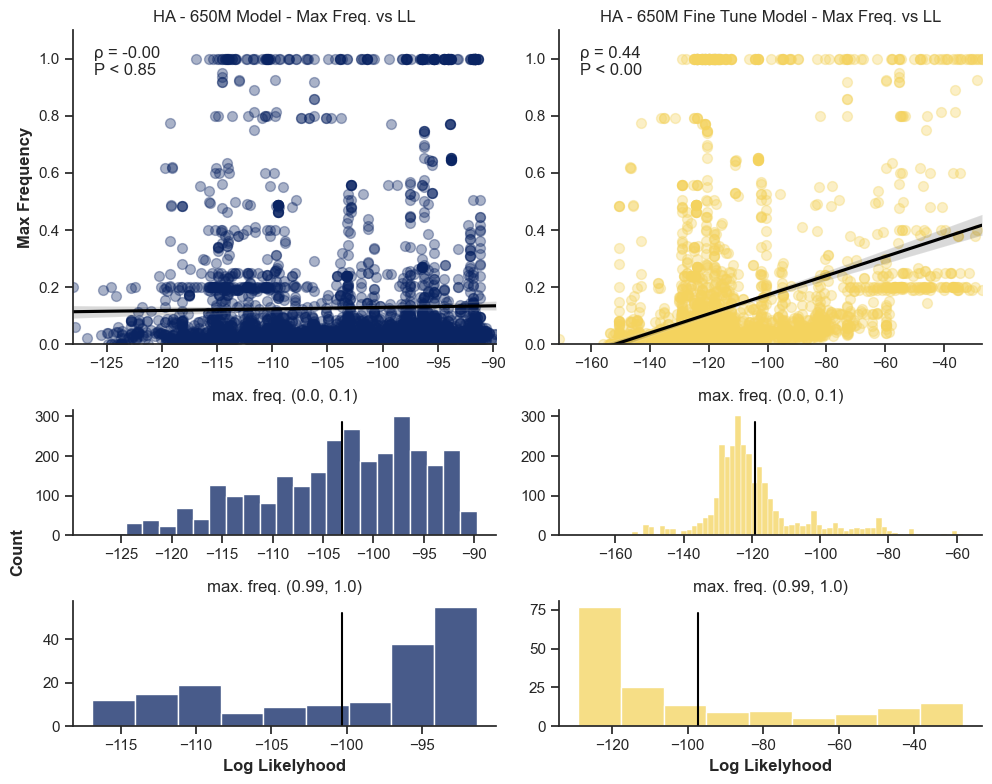

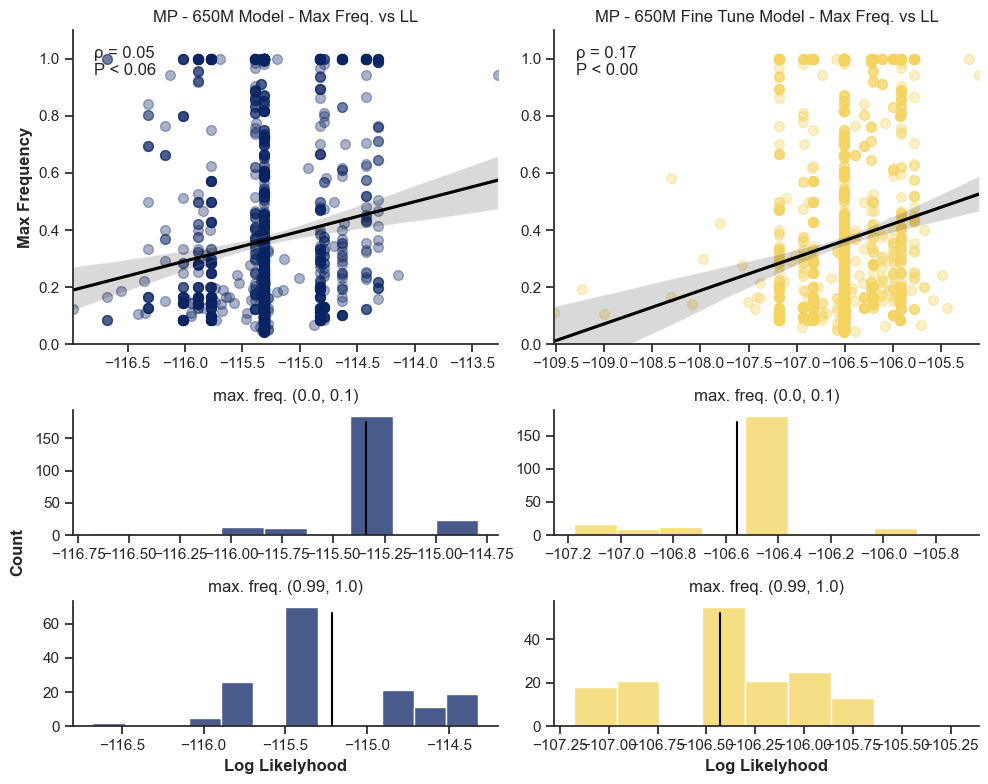

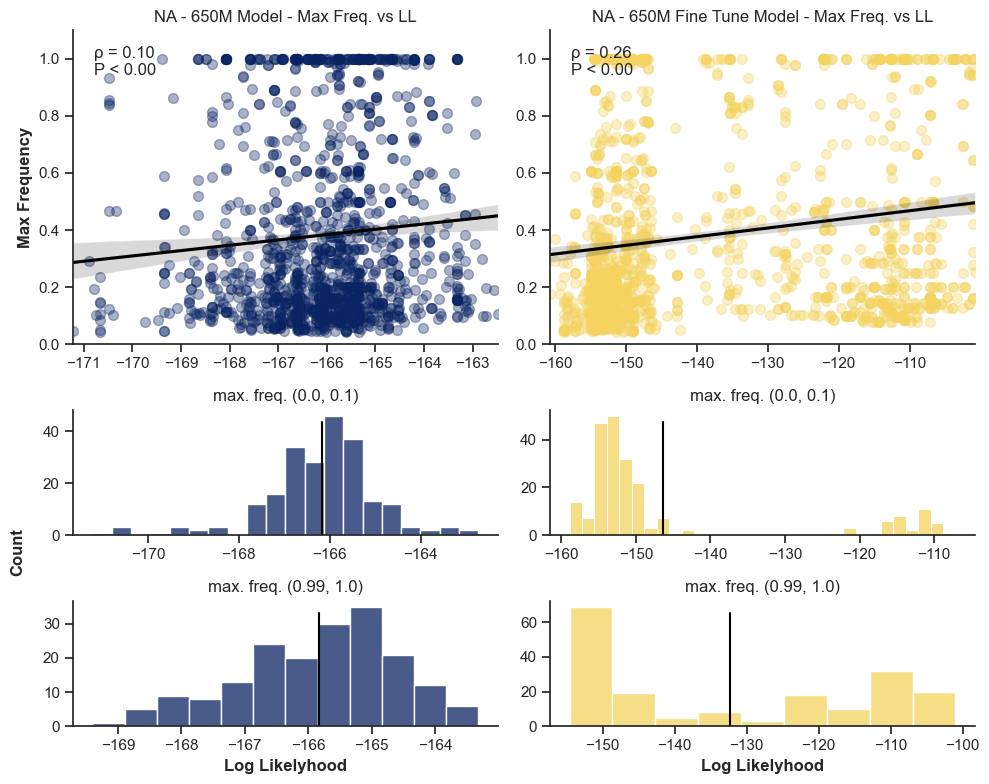

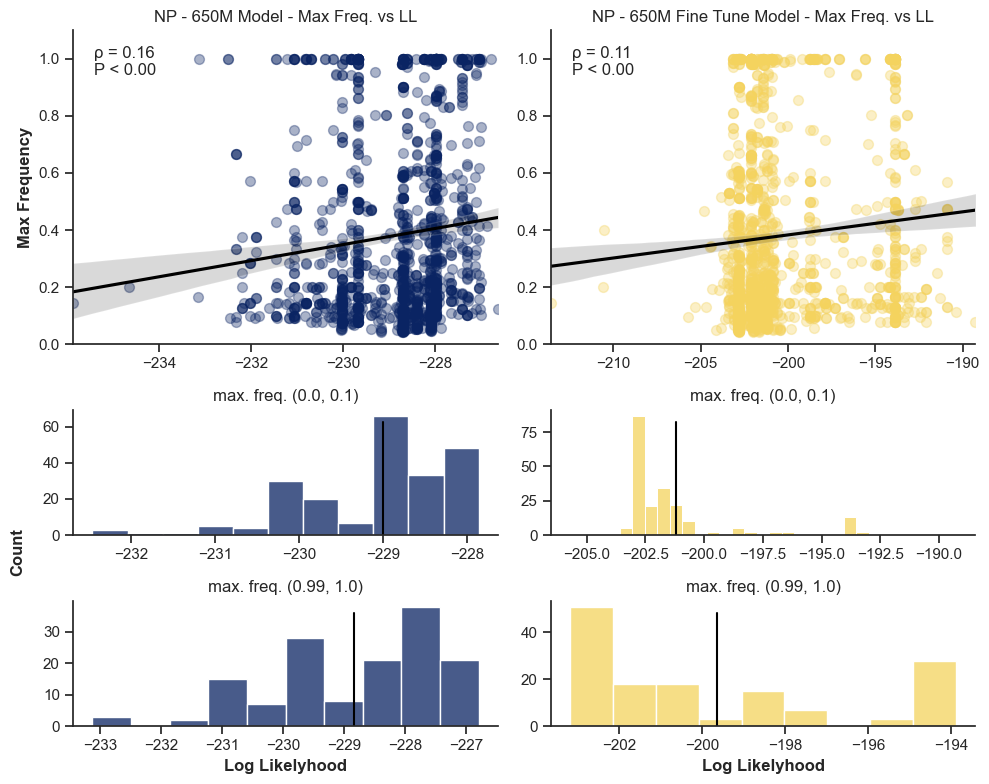

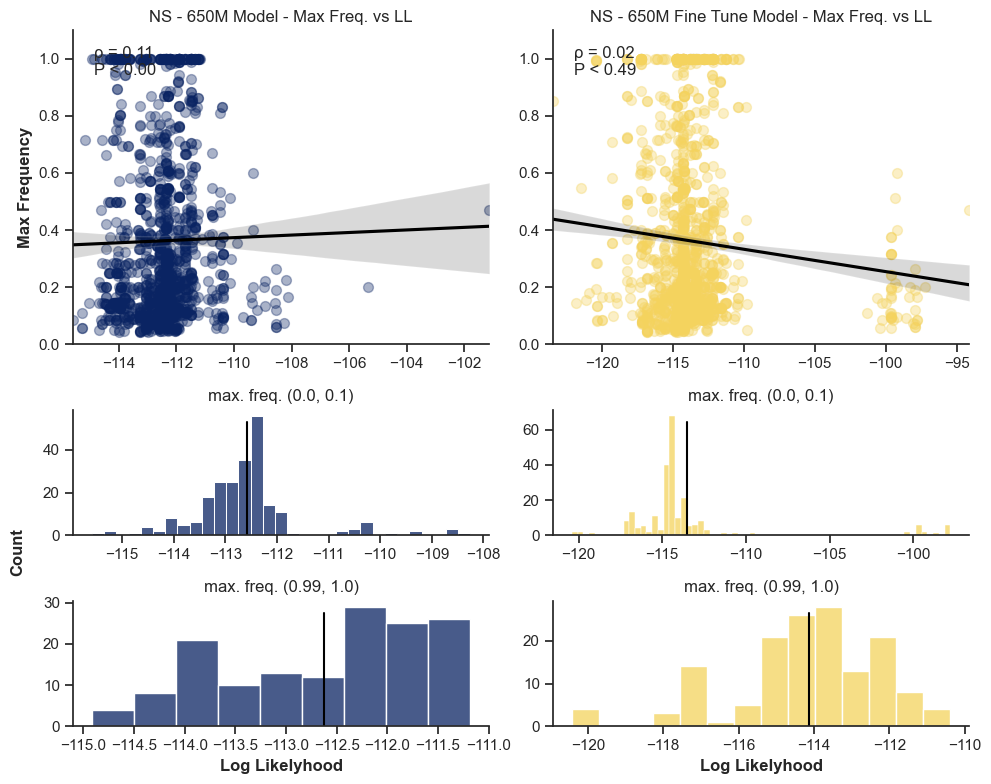

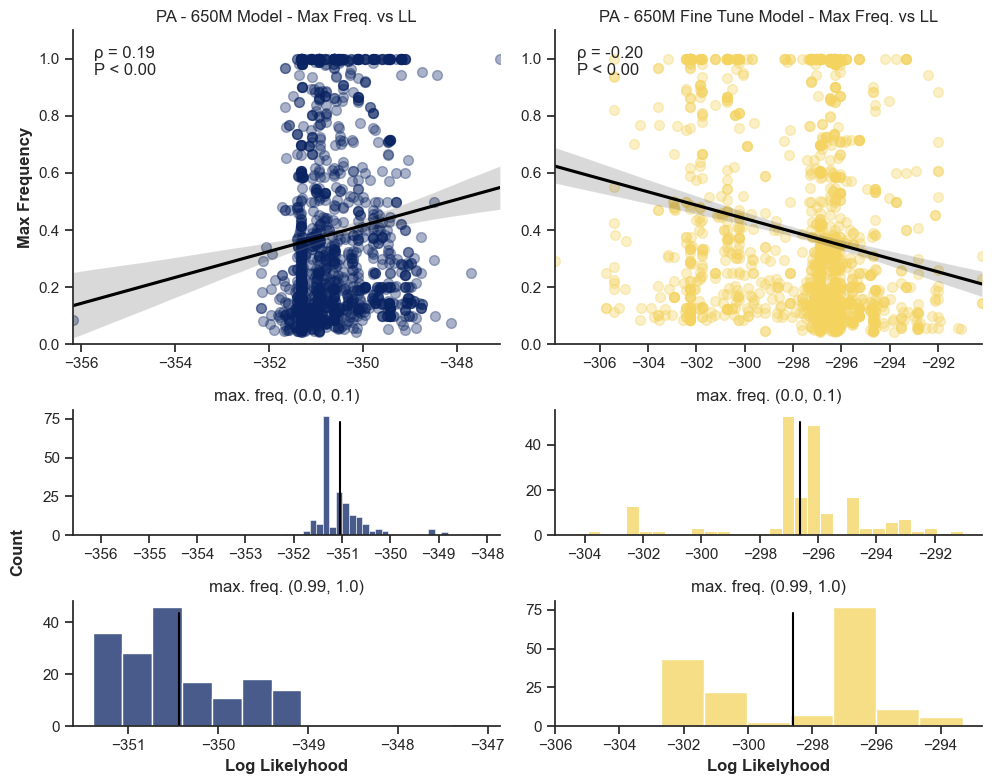

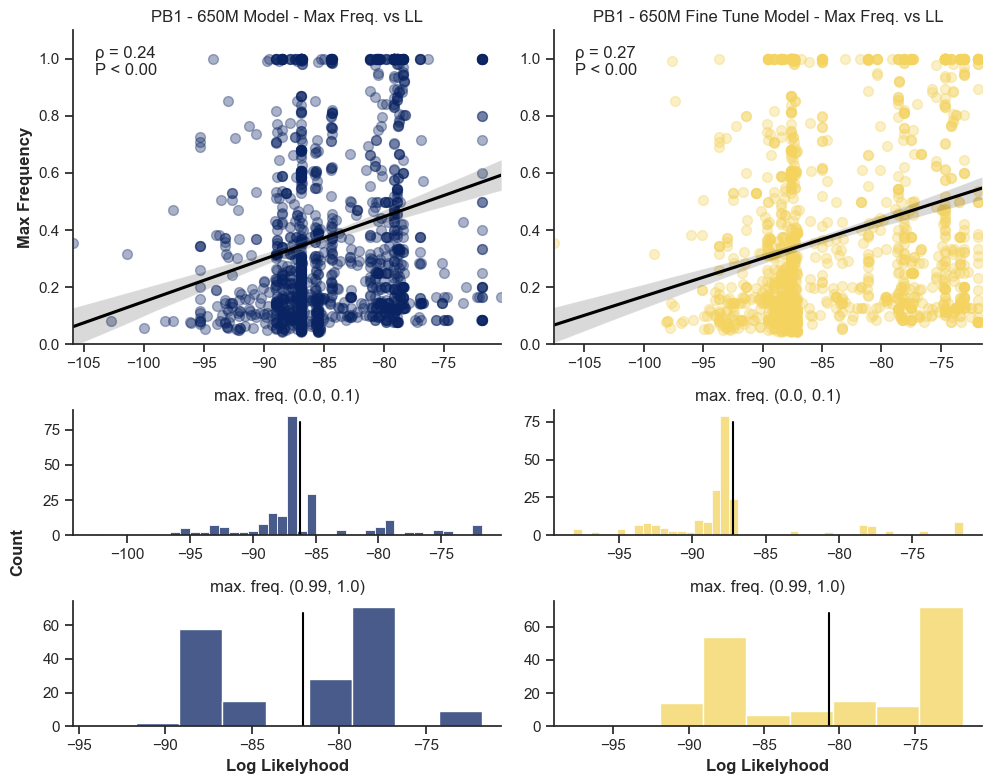

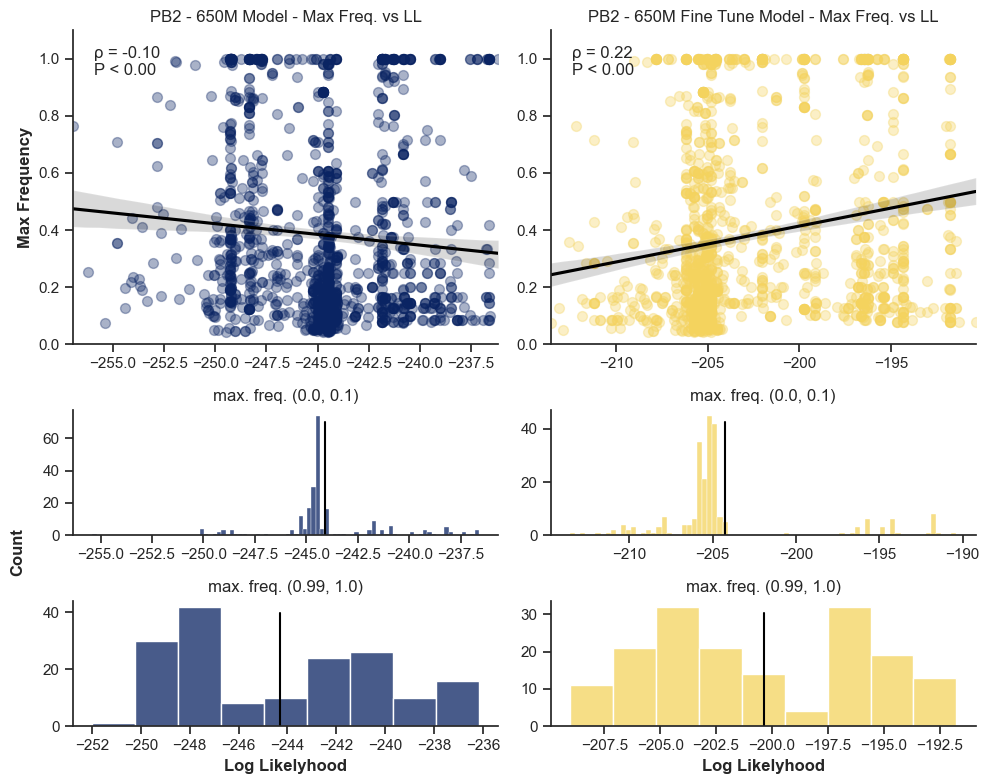

In [15]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import gridspec
from scipy.stats import spearmanr

# Look nicer in Jupyter on Mac
#%config InlineBackend.figure_format = 'retina'

#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"
#output_dir = os.path.join("/Users/Carlos/Desktop/Bedford/esm-selection/ESM_vs_Max_Freq_Plots_Fine_Tune_650M/")

os.makedirs(output_dir, exist_ok=True)

sns.set_theme(style="whitegrid")
sns.set_style("ticks")

dataset = df_650_FT_DF
model = "650M"

def plot_regression(ax, data, x_col, y_col, title, ylabel="", color="#0a2463"):
    sns.regplot(data=data, y=y_col, x=x_col, ax=ax, scatter_kws={'s': 50, 'alpha': 0.35, 'color': color}, line_kws={'color': 'black'})
    ax.set_title(title)
    ax.set_xlabel("")
    spearman_corr, p_value = spearmanr(data[y_col], data[x_col])
    textstr = (
        f'ρ = {spearman_corr:.2f}\n'
        f'P < {p_value:.2f}\n'
    )
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.0))
    ax.set_ylabel(ylabel, weight='bold')
    ax.set_xlim(data[x_col].min(), data[x_col].max())
    ax.set_ylim(0, 1.1)

def plot_histogram(ax, data, mean_value, title, xlabel="", color="#0a2463"):
    sns.histplot(data=data, x="log_likelyhood", ax=ax, color= color)
    ax.set_title(title)
    ax.axvline(mean_value, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
    ax.set_ylabel("")
    ax.set_xlabel(xlabel, weight='bold' if xlabel else 'normal')

for segment, group in dataset.groupby('Segment'):

    fig = plt.figure(figsize=(5 * 2, 8))
    #gs_main = gridspec.GridSpec(3, 2, height_ratios=[1, 0.4, 0.4])

    df = dataset[dataset['Segment'] == segment]

    if segment == "PA":
        df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

    df_650 = df[df['Model'] == model]
    df_650_Fine_Tune = df[df['Model'] == ("Fine_Tune_" + model)]

    df_below_1_650 = df_650[df_650['max_frequency'] < 0.1]
    df_above_1_650 = df_650[df_650['max_frequency'] >= 0.99]
    df_below_1_Fine_Tune = df_650_Fine_Tune[df_650_Fine_Tune['max_frequency'] < 0.1]
    df_above_1_Fine_Tune = df_650_Fine_Tune[df_650_Fine_Tune['max_frequency'] >= 0.99]

    gs_main = gridspec.GridSpec(3, 2, height_ratios=[1, 0.4, 0.4])  


    ax = fig.add_subplot(gs_main[0, 0])     
    ax_1 = fig.add_subplot(gs_main[0, 1])    

    ax1 = fig.add_subplot(gs_main[1, 0])      
    ax1_1 = fig.add_subplot(gs_main[1, 1])   

    ax2 = fig.add_subplot(gs_main[2, 0])      
    ax2_1 = fig.add_subplot(gs_main[2, 1])    

    plot_regression(ax, df_650, "log_likelyhood", "max_frequency", f"{segment.upper()} - {model} Model - Max Freq. vs LL", ylabel="Max Frequency")
    plot_regression(ax_1, df_650_Fine_Tune, "log_likelyhood", "max_frequency", f"{segment.upper()} - {model} Fine Tune Model - Max Freq. vs LL", color='#f4d35e')
    #plot_regression(ax_2, df_15B, "log_likelyhood", "max_frequency", f"{segment.upper()} - 15B Model - Max Freq. vs LL", color='#890304')

    mean_below_1_650 = df_below_1_650['log_likelyhood'].mean()
    mean_below_Fine_Tune = df_below_1_Fine_Tune['log_likelyhood'].mean()

    plot_histogram(ax1, df_below_1_650, mean_below_1_650, "max. freq. (0.0, 0.1)")
    plot_histogram(ax1_1, df_below_1_Fine_Tune, mean_below_Fine_Tune, "max. freq. (0.0, 0.1)", color='#f4d35e')
    #plot_histogram(ax1_2, df_below_1_15B, mean_below_1_15B, "max. freq. (0.0, 0.1)", color='#890304')

    mean_above_1_650 = df_above_1_650['log_likelyhood'].mean()
    mean_above_Fine_Tune = df_above_1_Fine_Tune['log_likelyhood'].mean()

    plot_histogram(ax2, df_above_1_650, mean_above_1_650, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood")
    plot_histogram(ax2_1, df_above_1_Fine_Tune, mean_above_Fine_Tune, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#f4d35e')
    #plot_histogram(ax2_2, df_above_1_15B, mean_above_1_15B, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#890304')

    for axis in [ax, ax_1, ax_2, ax1, ax2, ax1_1, ax2_1, ax1_2, ax2_2]:
        axis.spines[['right', 'top']].set_visible(False)

    fig.text(0.01, 0.3, 'Count', va='center', rotation='vertical', fontsize=12, weight='bold')
    plt.tight_layout()

    plt.savefig(f"/Users/Carlos/Desktop/Bedford/esm-selection/ESM_vs_Max_Freq_Plots_Fine_Tune_{model}/{segment}_LL_vs_Max_Frequency_Fine_Tune_{model}.png", dpi=300)

